<a href="https://colab.research.google.com/github/ahozdemir/sayisalgoruntuisleme/blob/main/ImageProccessingFinalProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Görüntü İşleme


https://colab.research.google.com/drive/1kzEiewWORmOasYFJHB0liigz-IYAYihC?usp=sharing

Bu arasınavda, ChestX-ray8 veri seti kullanılarak göğüs röntgeni görüntüleri üzerinde veri keşfi ve görüntü işleme tekniklerini uygulayacaksınız. Aşağıdaki yönergeleri adım adım takip ederek gerekli kodları yazın ve sonuçları analiz ederek yorumlayın.




---



## **1.	Kütüphanelerin İçe Aktarılması**
o	Veri işleme için pandas, sayısal işlemler için numpy, opencv ve skimage görselleştirme için matplotlib ve seaborn kütüphanelerini içe aktarın.
o	Ayrıca os modülünü kullanarak dosya yolunu belirtin.


In [1]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from skimage import data, exposure
from skimage.filters import threshold_multiotsu
import kagglehub #kaggle data seti icin eklendi.
from PIL import Image  # resim bilgileri icin


## **2. Görüntü Yükleme ve Görselleştirme**
1.	Rastgele Görüntüler Seçme
o	train_df içindeki "Image" sütunundan rastgele 9 görüntü seçin.
o	Bu görüntüleri yan yana görselleştirerek veri setindeki örnek görüntüleri inceleyin.


In [2]:
!pwd

# Download latest version
path = kagglehub.dataset_download("tolgadincer/labeled-chest-xray-images")

print("Path to dataset files:", path)

/content


100%|██████████| 1.17G/1.17G [00:14<00:00, 86.7MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/tolgadincer/labeled-chest-xray-images/versions/1


In [3]:
!echo $path
!pwd

!find / -name 'labeled-chest-xray-images'
%ls

/root/.cache/kagglehub/datasets/tolgadincer/labeled-chest-xray-images/versions/1
/content
find: ‘/proc/68/task/68/net’: Invalid argument
find: ‘/proc/68/net’: Invalid argument
/root/.cache/kagglehub/datasets/tolgadincer/labeled-chest-xray-images
sample_data/


In [4]:
!mv -v /root/.cache/kagglehub/datasets/tolgadincer/labeled-chest-xray-images /content/sample_data

renamed '/root/.cache/kagglehub/datasets/tolgadincer/labeled-chest-xray-images' -> '/content/sample_data/labeled-chest-xray-images'


2. Görüntü Yükleme ve *Görselleştirme*

In [5]:
def get_all_images(directory):
  # Goruntulerin dataframe icine yükleme
  files = os.listdir(directory) # parametre olarak directory gelecek
  all_images = []  # all images, in folder
  for file in files:
      image_path = os.path.join(directory)
      image_full_path = os.path.join(directory, file)
      width, height = Image.open(image_full_path).size
      all_images.append([file, image_path])
  # Create DataFrame
  train_df = pd.DataFrame(all_images,columns=['image_name', 'image_path'])
  return train_df

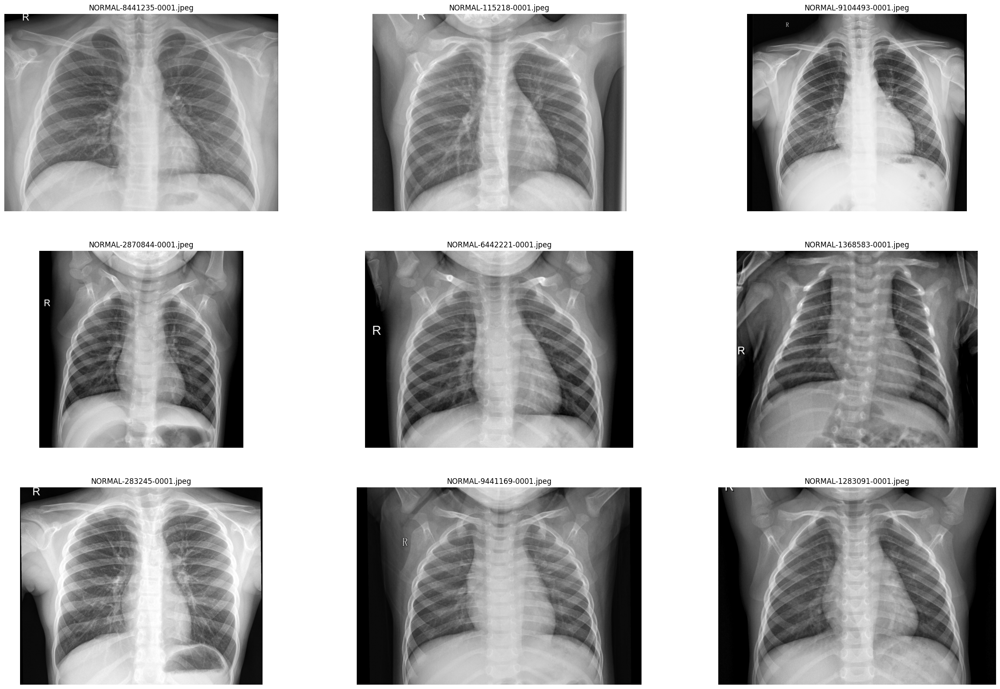

In [6]:
# PArametre olarak verilen sayidaki resmi, verilen dataframe icinden random olarak al ve getir.
random_images = []
def get_random_images(number_of_images, train_df):
  for i in range(number_of_images):
    rnd_image=np.random.choice(train_df.index)
    img_path = os.path.join(train_df['image_path'].iloc[rnd_image], train_df['image_name'].iloc[rnd_image])
    random_images.append(img_path)
  return random_images

# parametre olarak gecilen sayida resmi, goster
def show_images(random_images):
  for i in range(len(random_images)):
    img = plt.imread(random_images[i])
    plt.subplot(3, 3, i + 1)
    plt.imshow(img, cmap='gray')
    title = f"{train_df['image_name'].iloc[i]}"
    plt.title(title) # title bir ust satirda.
    plt.axis('off')

plt.figure(figsize=(30,20))
train_df = get_all_images('/content/sample_data/labeled-chest-xray-images/versions/1/chest_xray/test/NORMAL')
get_random_images(9, train_df) # Passing the DataFrame to the function
show_images(random_images)

## **3. Görüntü İşleme ve İyileştirme (Pre-processing)**
1.	Görüntüleri Akciğer bölgeleri kaybolmayacak şekilde kenarlardan kırpın (Crop),(ilgi alanı dışındaki gürültü bölgelerinden kurtulun
o	Orijinal ve Crop edilmiş görüntüleri görseleştirin.
2.	Arasınav ödevi çıktılarını inceleyerek Kontrast Germe (Stretching) Histogram Eşitleme (Equalization) yöntemlerinden uygun gördüğünüzü crop edilmiş görüntüye uygulayın. (YORUM)
o	Crop edilmişve dönüşüme uğramış  görüntüleri görseleştirin.

3.	Bir önceki adımın çıktısına gürültü azaltma işlemlerinden birini seçerek uygulayın (örn: Median ve Gaussian Blur).
o	Görüntüleri görseleştirin


## 3.1.	Görüntüleri Akciğer bölgeleri kaybolmayacak şekilde kenarlardan kırpın (Crop),(ilgi alanı dışındaki gürültü bölgelerinden kurtulun Orijinal ve Crop edilmiş görüntüleri görseleştirin.


Izleyecegim yol

1.   buttom-left ve top-left noktalarin koordinatini getir.
2.   buttom-right ve buttom-top noktalarinin koordinatini getir.
3.   koselerden soldan-saga, ve sagdan-sola dogru piksellerin rengine bak
4.   eger pure black veya ona yakinsa bir sonrakine gec. pure black olmakdan cikti ise coordinati tespit et..
5.   tespit ettigin koordinatlara gore crop işlemini gerceklestir.

https://doc-origin.euresys.com/Products/Open_eVision/Open_eVision_2_16/en-us/Content/03_Using/1_Starting_Up/3_Manipulating/Image_Coordinate_Systems.htm


In [7]:

print(random_images[0])

/content/sample_data/labeled-chest-xray-images/versions/1/chest_xray/test/NORMAL/NORMAL-8907762-0001.jpeg


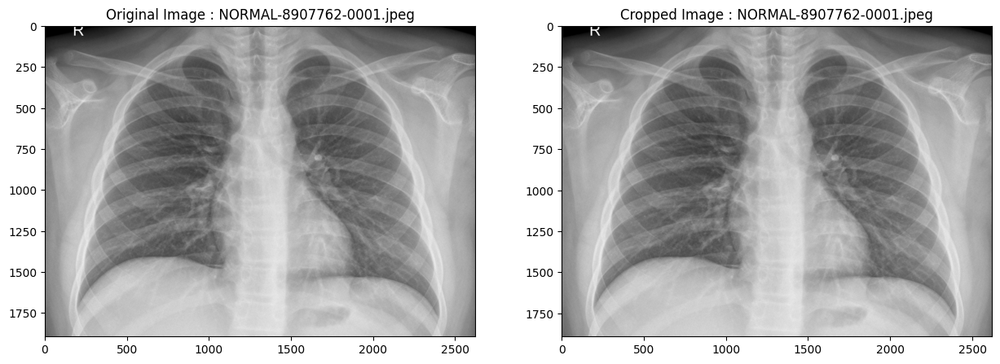

Left: 1, Right: 2, Top: 0, Bottom: 1


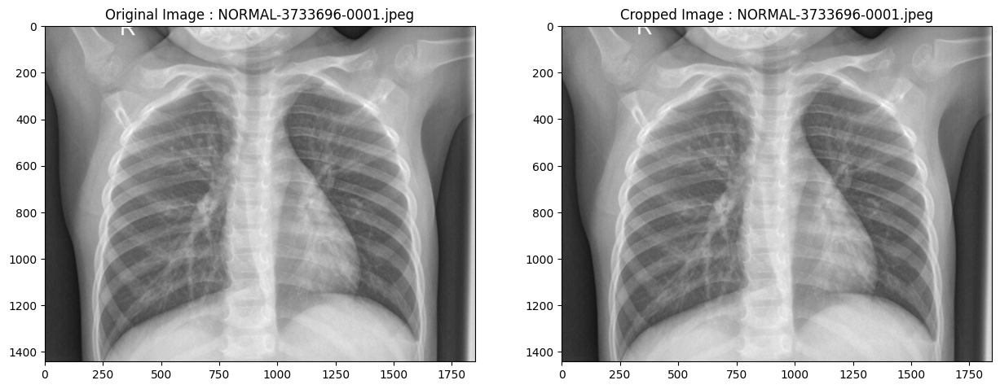

Left: 1, Right: 3, Top: 0, Bottom: 1


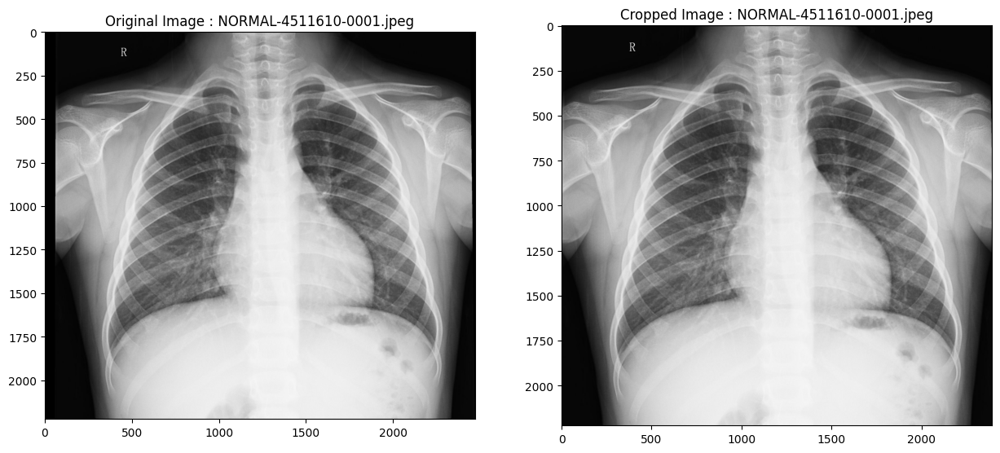

Left: 60, Right: 21, Top: 0, Bottom: 1


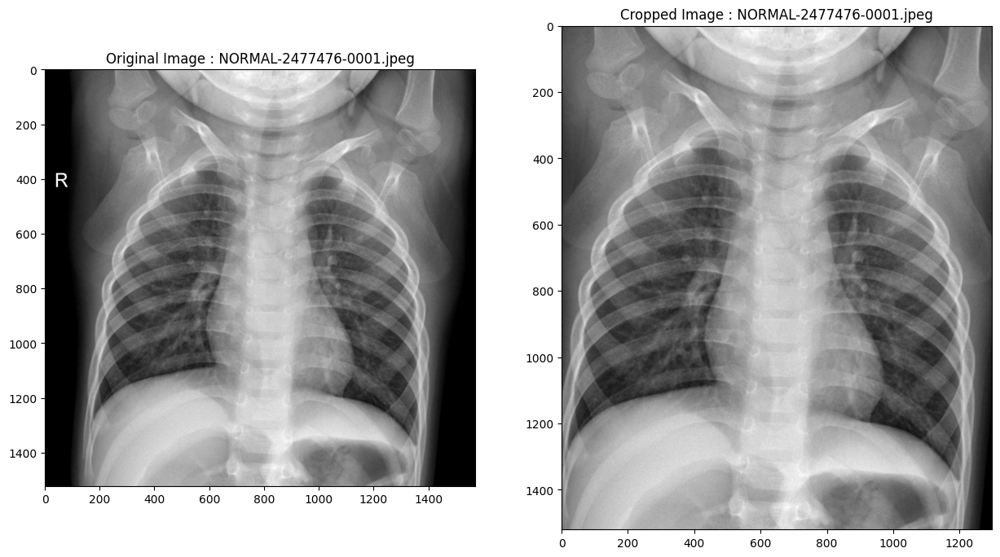

Left: 157, Right: 116, Top: 0, Bottom: 1


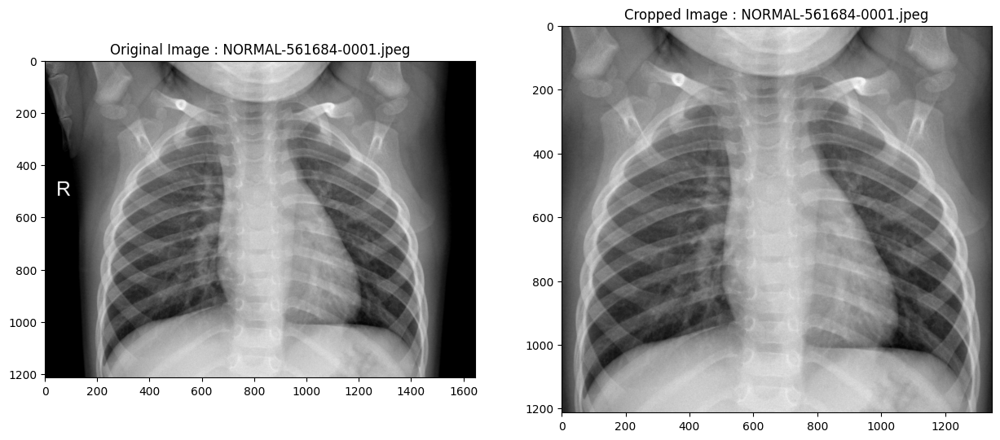

Left: 155, Right: 143, Top: 0, Bottom: 1


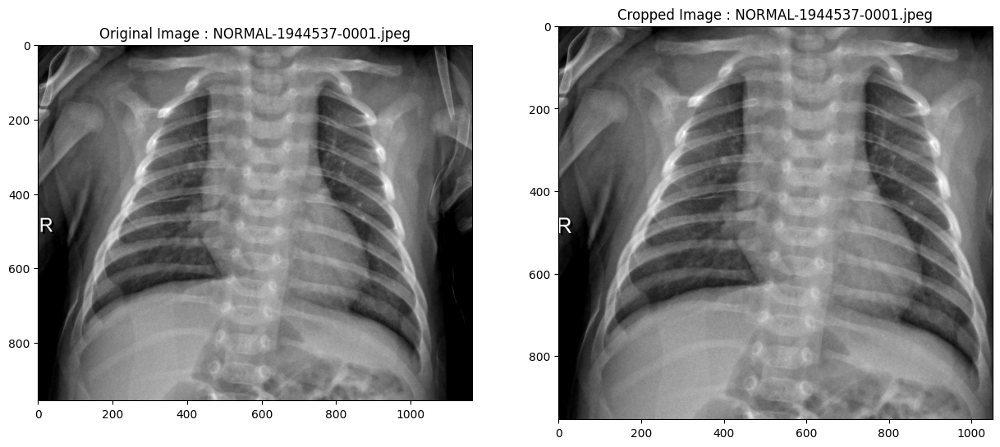

Left: 8, Right: 105, Top: 0, Bottom: 1


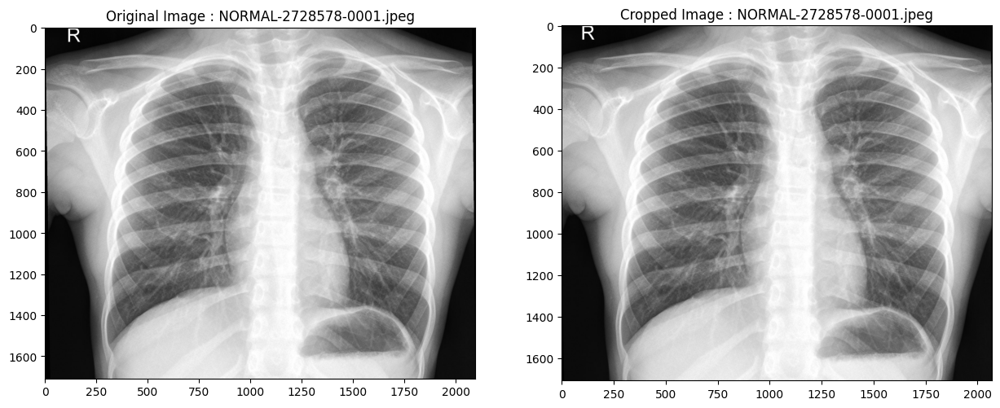

Left: 14, Right: 11, Top: 0, Bottom: 1


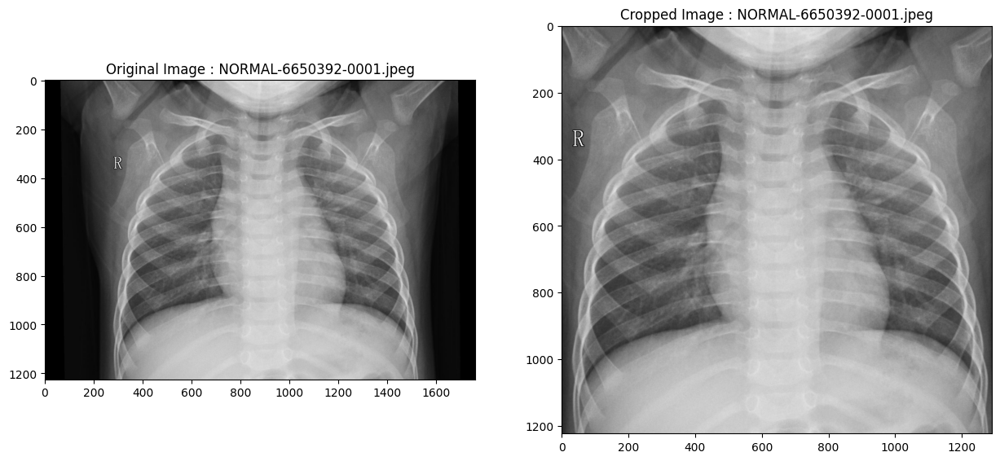

Left: 248, Right: 223, Top: 0, Bottom: 1


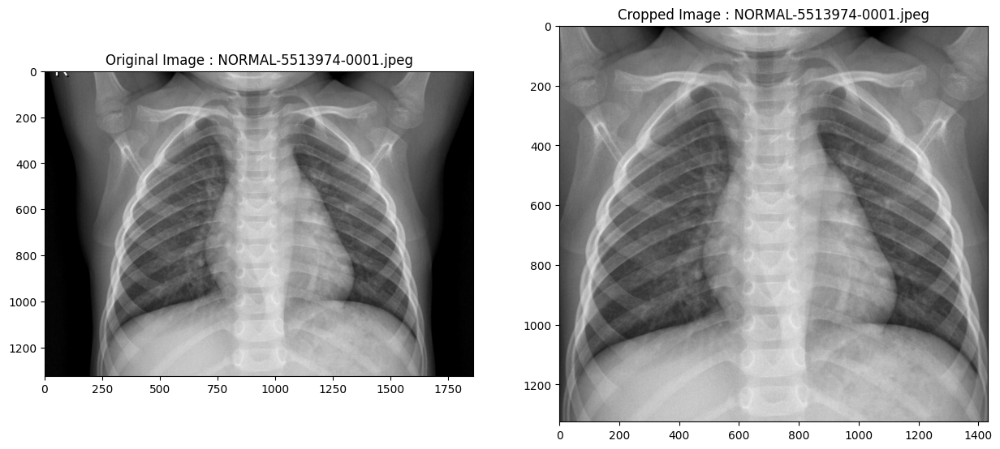

Left: 216, Right: 213, Top: 0, Bottom: 1


In [9]:
# croped imageleri saklamak icin folder create ettim.
if not os.path.exists('/content/sample_data/cropped_images'):
  os.mkdir('/content/sample_data/cropped_images')
# ! mkdir  /content/sample_data/cropped_images


# En yaki siyah pikseli bulmak icin
def black_line(img, x, y, direction):
    width, height = img.size
    while 0 <= x < width and 0 <= y < height:
        pixel = img.getpixel((x, y))
        if sum(pixel) / 3 < 60:
            if direction == 'right':
                x += 1
            elif direction == 'left':
                x -= 1
            elif direction == 'down':
                y += 1
            elif direction == 'up':
                y -= 1
        else:
            return x if direction in ['left', 'right'] else y
    return x if direction in ['left', 'right'] else y



def crop_image_by_edges(image, left, right, top, bottom):
    height, width = image.shape[:2]

    new_left = left
    new_right = width - right
    new_top = top
    new_bottom = height - bottom

    if new_right <= new_left or new_bottom <= new_top:
        raise ValueError("Boyutlar aşılıyorsa value error ver.. boyut hatasi var..")

    cropped_image = image[new_top:new_bottom, new_left:new_right]
    return cropped_image

# Load and process each image
for rnd_image in random_images:
    original_img = Image.open(rnd_image)
    original_img = original_img.convert('RGB')
    width, height = original_img.size

    left_start = black_line(original_img, 0, height//2, 'right')
    right_start = black_line(original_img, width-1, height//2, 'left')
    top_start = black_line(original_img, width//2, 0, 'down')
    bottom_start = black_line(original_img, width//2, height-1, 'up')

    image_cv = cv2.imread(rnd_image)
    cropped_image = crop_image_by_edges(image_cv, left_start, width - right_start, top_start, height - bottom_start)
    cv2.imwrite(f'/content/sample_data/cropped_images/{os.path.basename(rnd_image)}', cropped_image)
    # Display original and cropped image side by side
    plt.figure(figsize=(15, 10))
    plt.subplot(1, 2, 1)
    plt.title(f'Original Image : {os.path.basename(rnd_image)}')
    plt.imshow(cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for display
    plt.subplot(1, 2, 2)
    plt.title(f'Cropped Image : {os.path.basename(rnd_image)}')
    plt.imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))
    plt.show()

    # Print the boundaries used for cropping
    print(f"Left: {left_start}, Right: {width - right_start}, Top: {top_start}, Bottom: {height - bottom_start}")


## **3.2	Arasınav ödevi çıktılarını inceleyerek Kontrast Germe (Stretching) Histogram Eşitleme (Equalization) yöntemlerinden uygun gördüğünüzü crop edilmiş görüntüye uygulayın. (YORUM) Crop edilmişve dönüşüme uğramış  görüntüleri görseleştirin.**

## **3.3	Bir önceki adımın çıktısına gürültü azaltma işlemlerinden birini seçerek uygulayın (örn: Median ve Gaussian Blur).Görüntüleri görseleştirin**

In [11]:
# def get_all_cropped_images(directory):
#   # Goruntulerin dataframe icine yükleme
#   files = os.listdir(directory) # parametre olarak directory gelecek
#   all_cropped_images = []  # all images, from cropped_images folder
#   for file in files:
#       image_path = os.path.join(directory)
#       image_full_path = os.path.join(directory, file)
#       all_cropped_images.append([image_full_path])
#   #cropped_image_df = pd.DataFrame(all_cropped_images,columns=['image_full_path'])
#   return all_cropped_images

# # cropped images klasorundeki resimleri getir.
# all_cropped_images = get_all_cropped_images('/content/sample_data/cropped_images')
# # print(all_cropped_images[0])



In [10]:
#Gaussian Filtered resimleri icin klasor yaratioyorum
if not os.path.exists('/content/sample_data/gaussian_filtered_images'):
  os.mkdir ('/content/sample_data/gaussian_filtered_images')
else:
  print('Folder zaten var!!')

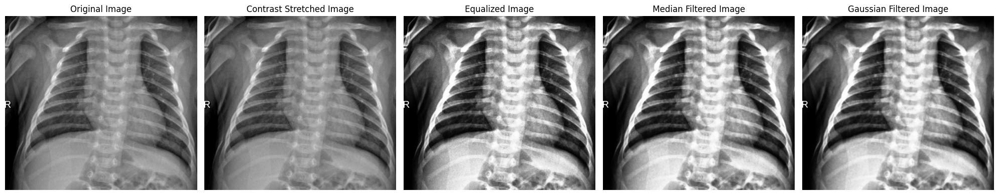

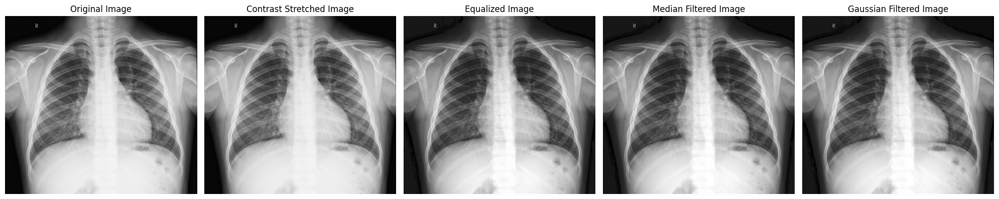

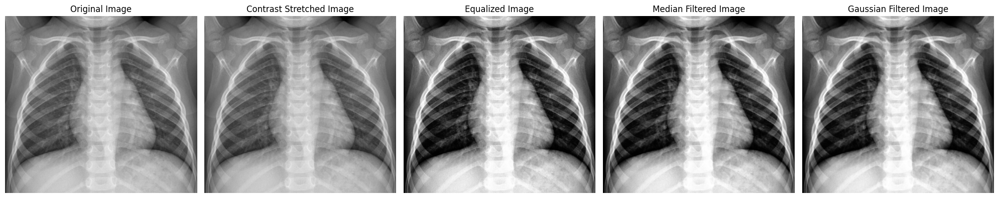

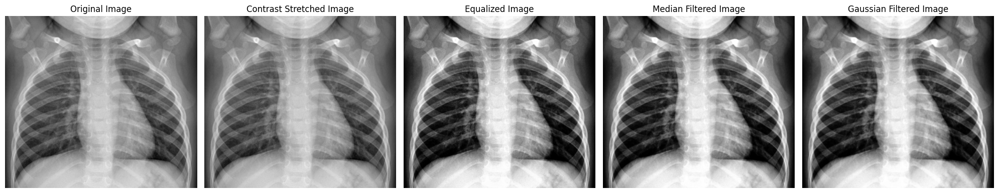

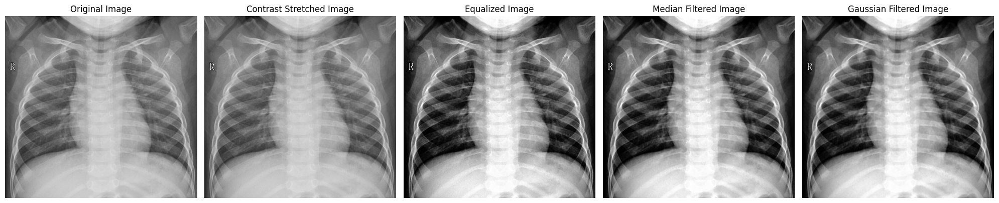

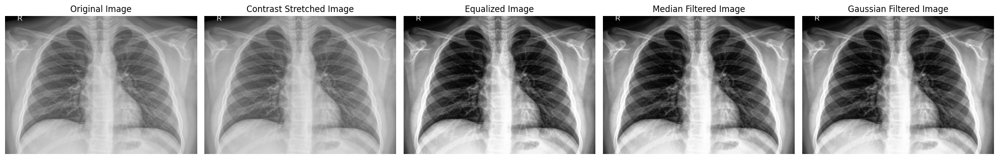

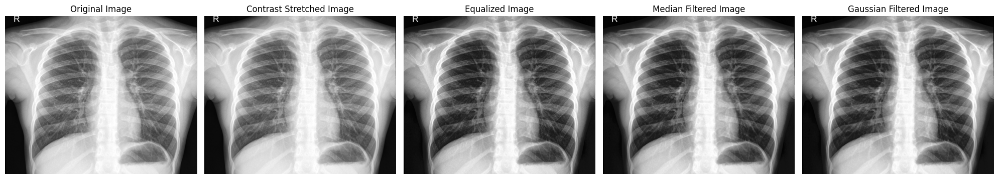

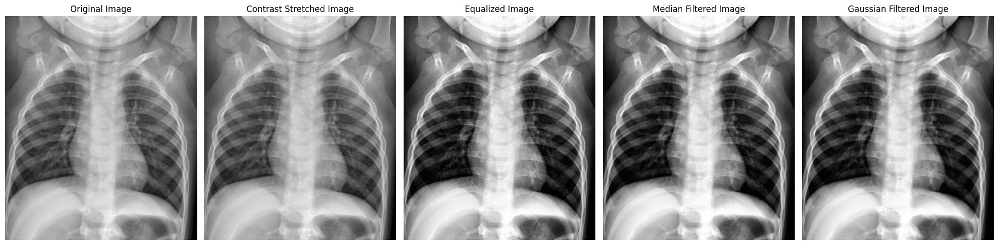

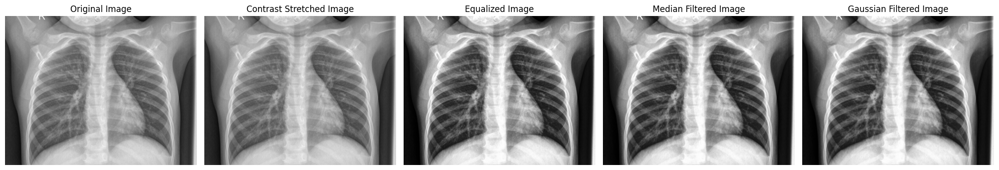

In [12]:
all_cropped_images = get_all_images('/content/sample_data/cropped_images')
# Assuming `all_cropped_images` is a list of file paths for cropped images
for index, row in all_cropped_images.iterrows():  # Iterate through rows of the DataFrame
    cropped_image_path = os.path.join(row['image_path'], row['image_name']) # Get the full image path
    # Step 1: Read the image using plt.imread
    raw_image = plt.imread(cropped_image_path)  # Read the image using the full path

    # Ensure the image is grayscale
    if raw_image.ndim == 3:
        raw_image = cv2.cvtColor(raw_image, cv2.COLOR_RGB2GRAY)

    # Step 2: Calculate min and max for contrast stretching
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)  # Normalize to [0, 1]
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)  # Scale to [0, 255]

    # Step 3: Apply histogram equalization
    equalized_image = exposure.equalize_hist(raw_image)  # Returns values in [0, 1]
    equalized_image = (equalized_image * 255).astype(np.uint8)  # Scale to [0, 255]

    # Step 4: Apply Median Filtering
    median_filtered = cv2.medianBlur(equalized_image, 5)

    # Step 5: Apply Gaussian Blur
    gaussian_filtered = cv2.GaussianBlur(median_filtered, (5, 5), 0)
    # Get the filename from cropped_image_path instead of raw_image
    cv2.imwrite(f'/content/sample_data/gaussian_filtered_images/{os.path.basename(cropped_image_path)}', gaussian_filtered)
    # Plotting the results
    plt.figure(figsize=(20, 10))

    # Plot Original Image
    plt.subplot(2, 5, 1)
    plt.imshow(raw_image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # Plot Contrast Stretched Image
    plt.subplot(2, 5, 2)
    plt.imshow(contrast_stretched, cmap='gray')
    plt.title('Contrast Stretched Image')
    plt.axis('off')

    # Plot Equalized Image
    plt.subplot(2, 5, 3)
    plt.imshow(equalized_image, cmap='gray')
    plt.title('Equalized Image')
    plt.axis('off')

    # Plot Median Filtered Image
    plt.subplot(2, 5, 4)
    plt.imshow(median_filtered, cmap='gray')
    plt.title('Median Filtered Image')
    plt.axis('off')

    # Plot Gaussian Filtered Image
    plt.subplot(2, 5, 5)
    plt.imshow(gaussian_filtered, cmap='gray')
    plt.title('Gaussian Filtered Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()



## **4.	Eşik sayısı belirleme**

o	Tek eşik değeri kullanacaksanız, Görüntülere Gauss yoğunluk dönüşümü gibi akciğer yoğunluk değerleri ile düşük ve yüksek değerleri ayıracak bir transform uygulayınız.

o	Dönüşüm uygulanmayacaksa optimum eşik sayısı belirlenmeli bunu dikkate alın. (örnek1: eşik sayısı 2 bölge sayısı 3 (alt-orta-üst)  orta=1, else=0, örnek2:esik sayısı 5, bölge sayısı 6 (a1-a2-o1-o2-u1-u2) o1&o2=1, else=0)




In [13]:
# Kesilen fotograflari bir klasore kaydetmistik.
all_gaussian_filtered_images = get_all_images('/content/sample_data/gaussian_filtered_images')

print(all_gaussian_filtered_images)

                 image_name                                     image_path
0  NORMAL-1944537-0001.jpeg  /content/sample_data/gaussian_filtered_images
1  NORMAL-4511610-0001.jpeg  /content/sample_data/gaussian_filtered_images
2  NORMAL-5513974-0001.jpeg  /content/sample_data/gaussian_filtered_images
3   NORMAL-561684-0001.jpeg  /content/sample_data/gaussian_filtered_images
4  NORMAL-6650392-0001.jpeg  /content/sample_data/gaussian_filtered_images
5  NORMAL-8907762-0001.jpeg  /content/sample_data/gaussian_filtered_images
6  NORMAL-2728578-0001.jpeg  /content/sample_data/gaussian_filtered_images
7  NORMAL-2477476-0001.jpeg  /content/sample_data/gaussian_filtered_images
8  NORMAL-3733696-0001.jpeg  /content/sample_data/gaussian_filtered_images


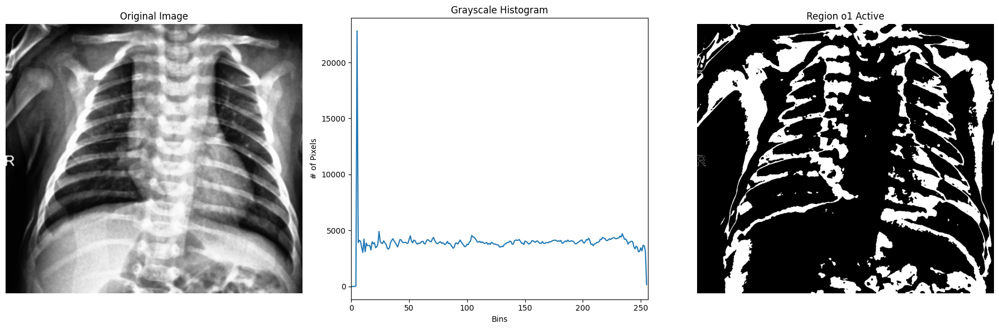

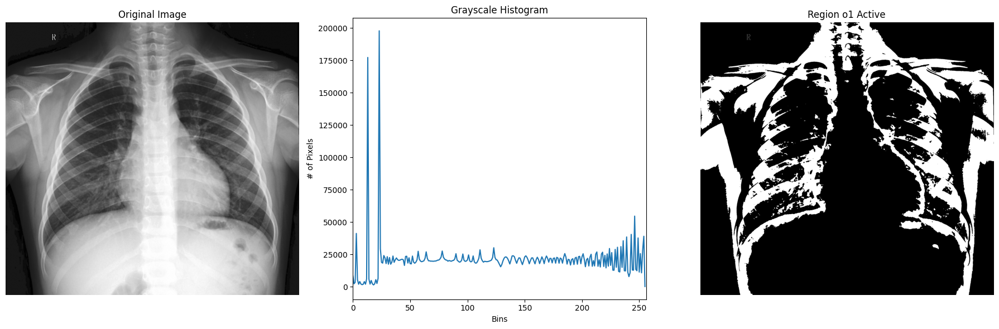

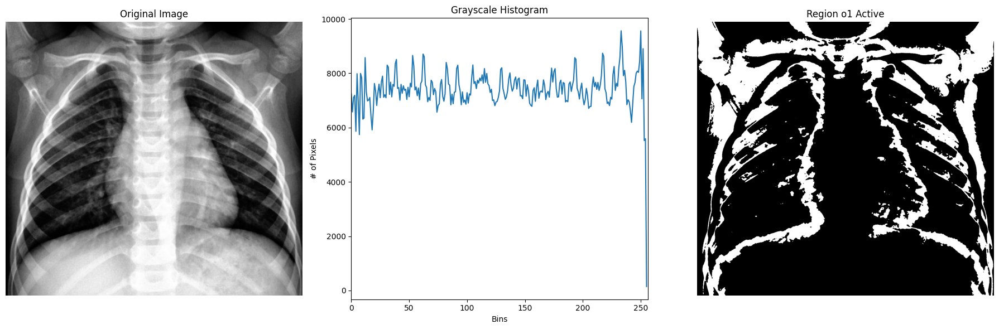

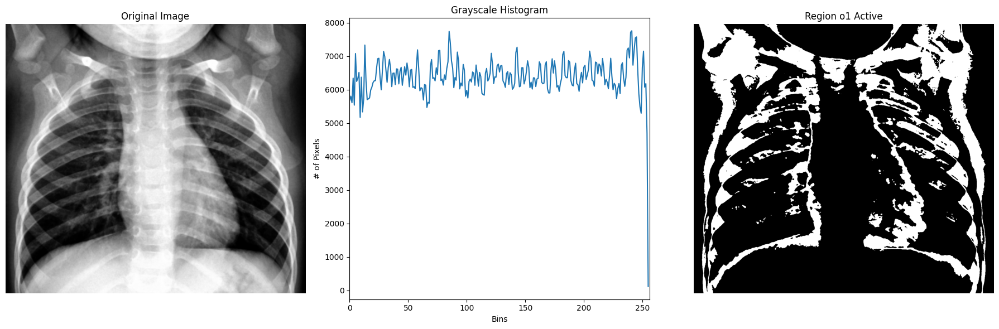

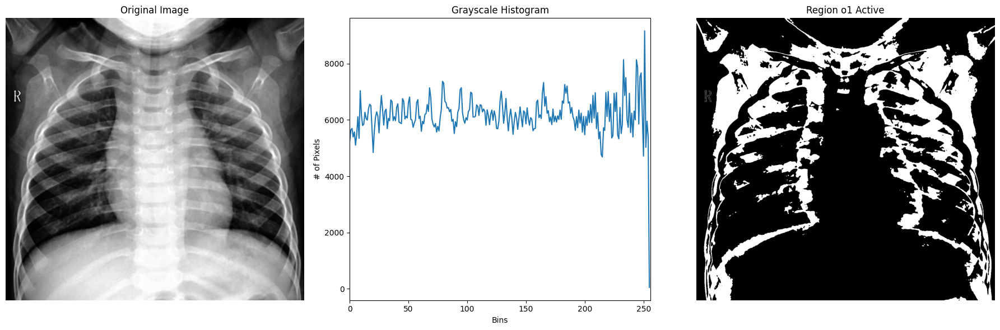

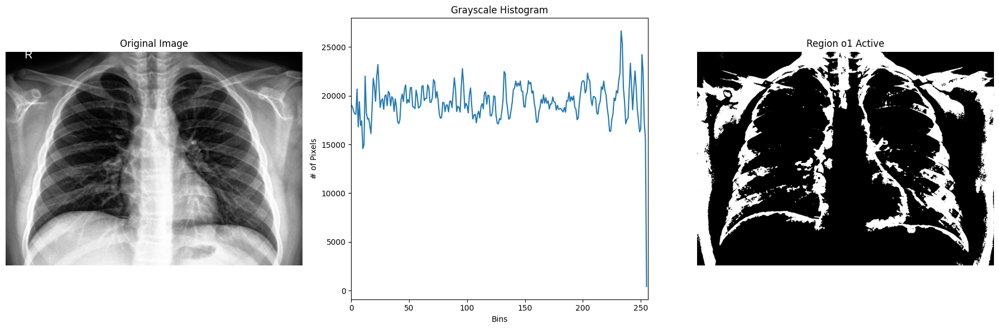

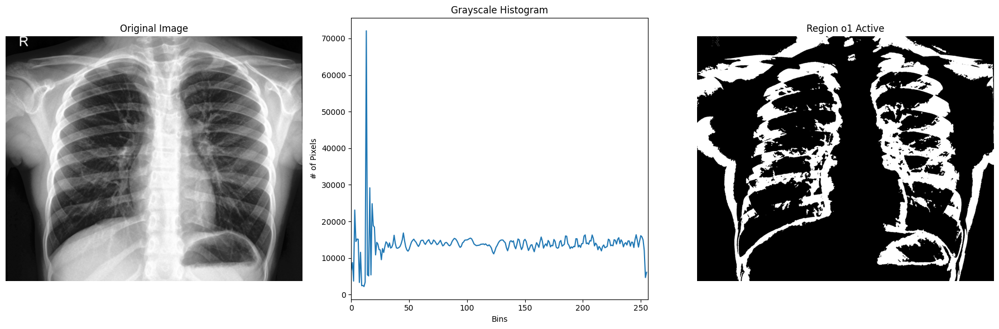

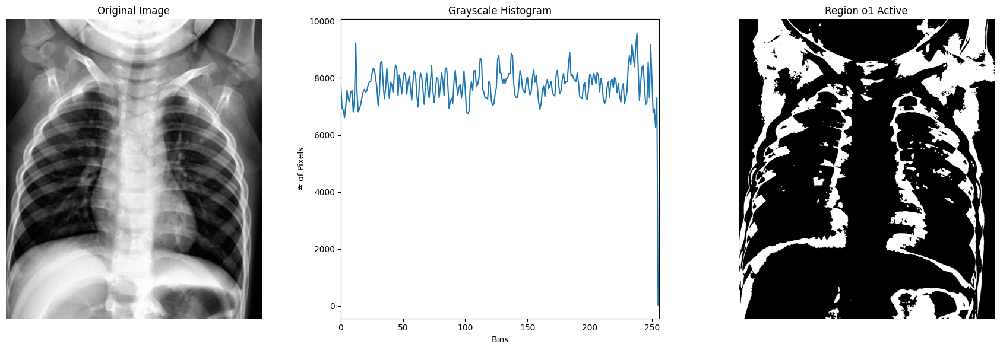

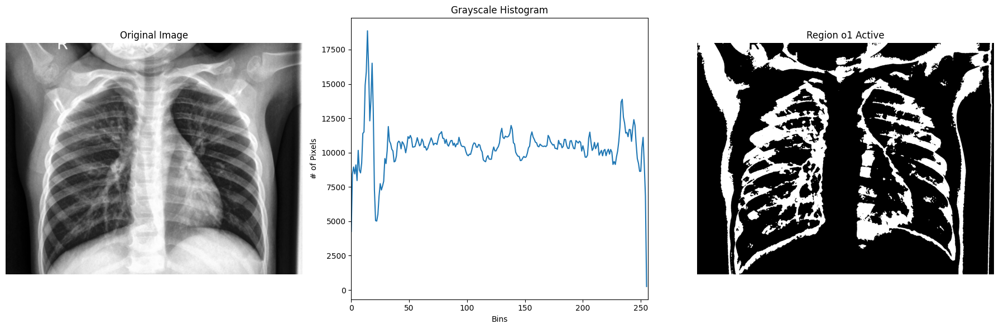

In [14]:
# Gaussian filter uygulanıp uygulanmadığını kontrol et
g_filtered = True  # True: Gaussian filtresi uygulandı, False: uygulanmadı.
if g_filtered:
    images_df = all_gaussian_filtered_images  # Gaussian filtrelenmiş görüntüler
else:
    images_df = all_cropped_images  # Orijinal görüntüler

# Görüntüleri döngüyle işle
for index, row in images_df.iterrows():
    image_path = os.path.join(row['image_path'], row['image_name'])
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Görüntüyü yükle (gri tonlama)

    # Histogramı hesapla
    hist = cv2.calcHist([img], [0], None, [256], [0, 256])

    # Eşik değerlerini uygula
    _, thresh1 = cv2.threshold(img, 85, 150, cv2.THRESH_BINARY)
    _, thresh2 = cv2.threshold(img, 150, 225, cv2.THRESH_BINARY_INV)
    region_o1 = cv2.bitwise_and(thresh1, thresh2)

    # Üç grafiği yan yana çiz
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))  # 1 satır, 3 sütun
    axs[0].imshow(img, cmap='gray')  # Orijinal görüntü
    axs[0].set_title("Original Image")
    axs[0].axis('off')  # Eksenleri gizle

    axs[1].plot(hist)  # Histogram
    axs[1].set_title("Grayscale Histogram")
    axs[1].set_xlabel("Bins")
    axs[1].set_ylabel("# of Pixels")
    axs[1].set_xlim([0, 256])  # Histogram sınırları

    axs[2].imshow(region_o1, cmap='gray')  # Aktif bölge
    axs[2].set_title("Region o1 Active")
    axs[2].axis('off')  # Eksenleri gizle

    # Grafikleri göster
    plt.tight_layout()
    plt.show()


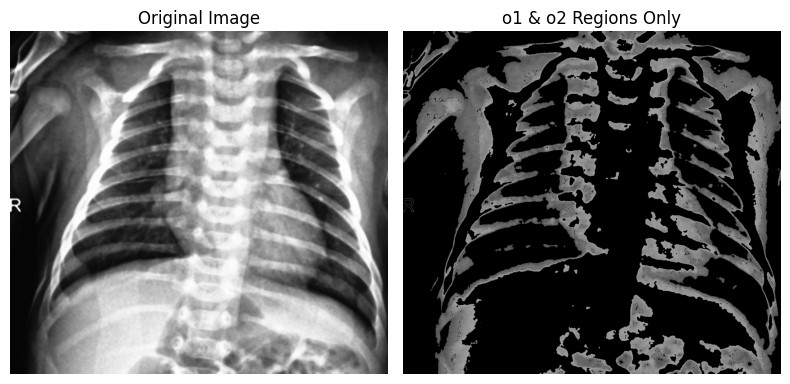

In [15]:
# image = os.path.join(all_cropped_images['image_path'], all_cropped_images['image_name'])
# print(image)

all_gaussian_filtered_images = get_all_images('/content/sample_data/gaussian_filtered_images')

# Görüntüyü yükle
image_path = os.path.join(all_gaussian_filtered_images.iloc[0]['image_path'], all_gaussian_filtered_images.iloc[0]['image_name'])
image = cv2.imread(image_path)
# Görüntüyü yumuşat
#blurred = cv2.GaussianBlur(image_path, (5, 5), 0)

# Eşik değerleri belirle (Bu değerler, 'o1' ve 'o2' bölgelerini belirlemek için özel olarak ayarlanmalıdır)
# Eşik değerleri örnek olarak verilmiştir, gerçek verilerinize göre ayarlanmalıdır.
thresholds = {'o1': (80, 120), 'o2': (121, 160)}  # Bu aralıklar histogram analizine göre ayarlanmalıdır.

regions = {}

# o1 ve o2 için maskeleme işlemini yap
for label, (low, high) in thresholds.items():
    _, low_thresh = cv2.threshold(image, low, 255, cv2.THRESH_BINARY)
    _, high_thresh = cv2.threshold(image, high, 255, cv2.THRESH_BINARY_INV)
    region = cv2.bitwise_and(low_thresh, high_thresh)
    regions[label] = region

# o1 ve o2 bölgelerinin birleşimi
combined_mask = cv2.bitwise_or(regions['o1'], regions['o2'])

# Sadece o1 ve o2 bölgelerini gösteren sonuç görüntüsü
final_image = cv2.bitwise_and(image, combined_mask)

# Sonuçları görselleştir
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(final_image, cmap='gray')
plt.title('o1 & o2 Regions Only')
plt.axis('off')

plt.tight_layout()
plt.show()


(-0.5, 2070.5, 1707.5, -0.5)

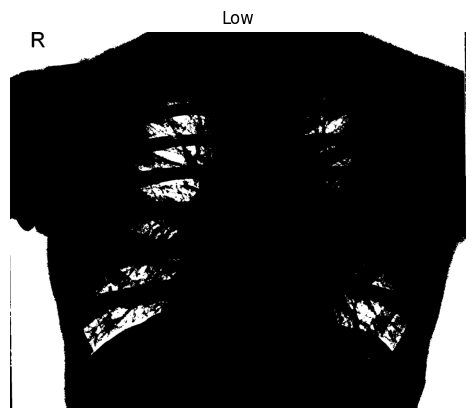

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import os

# Görüntüyü yükle
# Ensure the path is correct and the image exists
image_path = '/content/sample_data/cropped_images/'



image_files = [f for f in os.listdir(image_path) if os.path.isfile(os.path.join(image_path, f))]
random_image_file = random.choice(image_files)
full_image_path = os.path.join(image_path, random_image_file)

image = cv2.imread(full_image_path)

# Check if image loaded successfully
if image is None:
    print(f"Error: Could not load image from {image_path}")
    exit()  # Or handle the error appropriately

# Görüntüyü yumuşat
blurred = cv2.GaussianBlur(image, (5, 5), 0)

# Eşik değerleri belirle (Bu değerler, 'o1' ve 'o2' )
# Histograma gore ayarlanacak.
thresholds = {
    'low' : (0,80),
    'mid' : (81, 160),
    'high': (161, 255)
    }  # Bu aralıklar histogram analizine göre ayarlanacak.

regions = {}

# o1 ve o2 için maskeleme işlemini yap
# Changed loop to unpack only two values (low, high)
for label, (low, high) in thresholds.items():
    _, low_thresh = cv2.threshold(blurred, low, 255, cv2.THRESH_BINARY)
    # Assuming 'high' is intended as the upper threshold
    _, high_thresh = cv2.threshold(blurred, high, 255, cv2.THRESH_BINARY_INV)

    # Apply bitwise AND to get the region within the threshold range
    region = cv2.bitwise_and(low_thresh, high_thresh)

    # Store the region for the current label
    regions[label] = region

# o1 ve o2 bölgelerini görselleştir
plt.figure(figsize=(20, 10))
plt.subplot(1, 3, 1)
# Accessing the regions using the correct label names
plt.imshow(regions['low'], cmap='gray')
plt.title('Low')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(regions['mid'], cmap='gray')
plt.title('Mid')
plt.axis('off')


plt.subplot(1, 3, 3)
plt.imshow(regions['high'])
plt.title('High')
plt.axis('off')

plt.tight_layout()
plt.show()